**Disclaimer**: InStore Net Promoted Score is a Binary Classification project, based on this [Kaggle Competition](https://www.kaggle.com/competitions/instyle-nps). The context, company and business problem are ficticial.

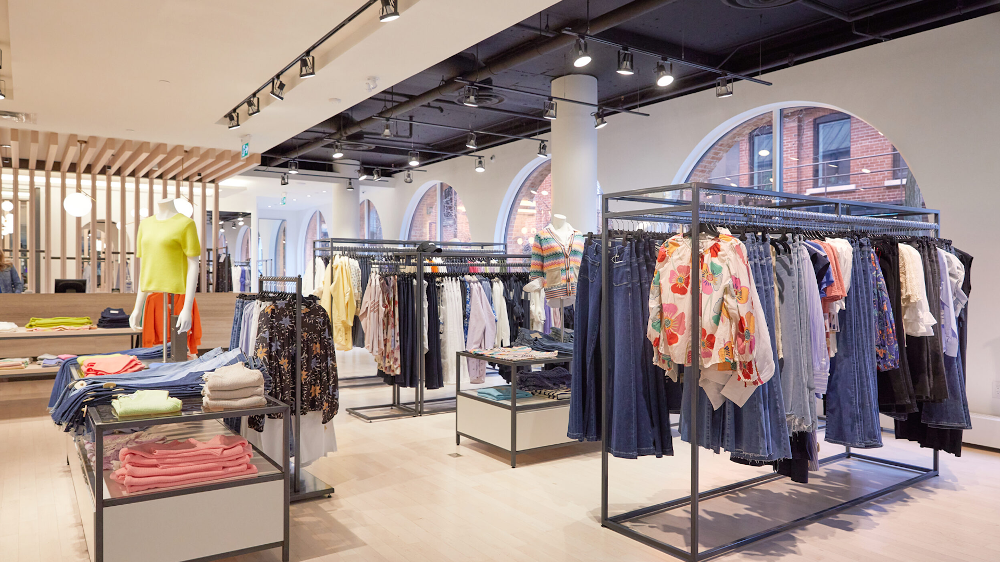

In [4]:
Image('C:/Users/ricardo/Documents/ds_repos/projects/InStyle_Net_Promoter_Score/reports/figures/wallpaper.png')

# 1. **BUSINESS SCENARIO**

## 1.1 - InStyle and their Business Problem
<p style="text-align: justify"> InStyle is one of the largest clothing stores in the United States facing customer experience issues.

The major challenge in scaling a store's revenue is to maintain product quality and high customer satisfaction rates.

As the company reaches more customers, internal sales processes starting from product conception, going through marketing promotion, and reaching financial payment systems begin to encounter issues.

The product team struggles to determine the majority of customers' needs. The marketing team faces challenges in identifying the ideal customer, and the development team grapples with high volumes of website and app traffic, leading to system crashes and rendering the site inoperable for hours. This, in turn, generates numerous complaints in customer service, led by the customer experience team.

Therefore, measuring customer satisfaction is extremely important for the company to maintain a good reputation in the market.

An interdisciplinary team called the "War Room," composed of professionals from Product, Marketing, Design, Data, and Development, was assembled to ensure an excellent customer shopping experience and a high satisfaction rate, even with the rapid growth in sales volume.

One of the War Room's first emergency actions was to provide personal assistance to customers. However, the initial challenge was to identify which customers had a "Satisfied" or "Neutral/Unsatisfied" satisfaction level, so the team could contact only the "Neutral/Unsatisfied" customers.

The Data Scientists of the War Room were tasked with training an algorithm to classify customers from a spreadsheet as "Satisfied" or "Neutral/Unsatisfied," predicting which customers might become Unsatisfied and, therefore, taking swift action to understand the reason for dissatisfaction and reverse the customer's situation. </p>

# 2. **SOLUTION STRATEGY**

<p style="text-align: justify"> The solution follows the CRISP-DM (Cross-Industry Standard Process for Data Mining), which is a cyclic method of development. At the end of the first cycle, the team will have a first version end-to-end of this solution, allowing them to achieve good results faster, identify and address potential problems effectively. </p>

In [5]:
Image('C:/Users/ricardo/Documents/ds_repos/projects/InStyle_Net_Promoter_Score/reports/figures/crispds.jpg')

### **Business Problem and Business Understanding:** 
<p> It is essential to fully understand the business problem being addressed. This involves engaging in conversations with stakeholders to gain a clear insight into the challenges and goals. Establish measurable objectives. Ensure that the proposed solution is aligned with the broader goals of the organization. Identify the target audience of the solution and understand their needs and expectations. This includes assessing the technical feasibility of the proposed solution. Ensure that all relevant information about the business problem is documented clearly and accessible to the entire team involved in the project. Maintain open and ongoing communication with stakeholders throughout the process. </p>

### **Data Extraction and Data Cleaning:**
<p>
Collecting, uploading, accessing the data to be used to solve the business questions. And runing an initial check on the datas to identify:

* Number of Rows
* Number of Columns
* Data Types
* NaN Values
* Statistic Analysis (Central tendency, dispersion, etc.) 

</p>

### **Exploratory Data Analysis:** 
<p>On this phase tree types of analysis are made:

* **Univariate Analysis:** To understand the distribution of each feature, if there are outliers, if it is a normal distribution, etc.
* **Bivariate Analysis:** Where some business hyphotesis are made and validate
* **Multivariate Analysis:** Correlation analysis among all features.
</p>


### **Data Modeling and Feature Engineering:**
<p>
Feature engineering consists in derivate/modify (new) features from the existing ones, aiming to find something that can help to better explain the phenomenon of study.

Modeling consists in work with the datas aiming to adjust them according the machine learning principles. Below, are some exemples about what are done in this phase:

* Handling with missing values (NaN): fill, remove, filter, etc.
* Encoding: change from categorical to numerical
* Scaling and Normalization: ensure the numerical variables are on a similar scale.
* Dimensionality Reduction: Applying techniques like Principal Component Analysis (PCA) to reduce the number of features while preserving as much information as possible.
* Feature Engineering: Iteratively selecting and refining features based on their importance or relevance to the problem.

</p>


### **Machine Learning Modelling:**
<p>
Model Selection: Choose appropriate machine learning algorithms based on the nature of the problem and data.
Training and Evaluation: Train models on the training set and evaluate their performance using the testing set.
Hyperparameter Tuning: Fine-tune model hyperparameters to optimize performance. This involves adjusting parameters that are not learned from the training data, such as learning rates or regularization terms.
</p>

### **Evaluation**
<p>
The evaluation phase involves analyzing the performance of the machine learning model to determine whether it meets the established criteria and is satisfactory for further advancement in the project. During this step, the chosen performance metrics are compared with the actual process or results.

### **Deployment** 
Publish the model in a cloud environment so that other people or services can use the results to improve and make business decisions.


# 3. **BUSINESS PROBLEM RESOLUTION**

## 0 - LIBRARIES AND HELPER FUNCTIONS

### 0.1 - LIBRARIES

**Loading the libraries to be used on the project**

In [1]:
# Data Analysis and Data Manipulation Libraries
import inflection
import joblib
import pandas                                       as pd
import numpy                                        as np
import seaborn                                      as sns
import scikitplot                                   as skplt
import plotly.express                               as px
import plotly.graph_objects                         as go
from matplotlib              import pyplot          as plt

# Data Processing
from sklearn                 import model_selection as ms
from sklearn                 import preprocessing   as pp
from sklearn.model_selection import KFold

#import optuna

# ML Models and Metrics
import lightgbm                                     as lgbm
from sklearn                 import ensemble        as en
from xgboost                 import XGBClassifier
from sklearn.linear_model    import LogisticRegression

from sklearn.metrics         import precision_score 
from sklearn.metrics         import precision_recall_curve
from sklearn.metrics         import confusion_matrix, ConfusionMatrixDisplay

# Dysplay
from IPython.core.display    import HTML
from IPython.display         import Image

import warnings
warnings.filterwarnings( 'ignore' )

### 0.2 - HELPER FUNCTIONS

**Personalized functions created to optimize the project**

In [2]:
# Function to help to indentify the best value for each parameter at time
def plot_scores(param_name, param_range, fixed_params, model, model_name, X_train, y_train, X_val, y_val):
    
    train_scores = []
    val_scores = []
    
    for param_value in param_range:
        params = fixed_params
        params[param_name] = param_value
        
        lgbm = model(**params)
        lgbm.fit(X_train, y_train)
        
        train_scores.append(precision_score(y_train, lgbm.predict(X_train)))
        val_scores.append(precision_score(y_val, lgbm.predict(X_val)))
    
    plt.figure(figsize=(8, 4))
    plt.plot(param_range, train_scores, label="Train", color="#264653", marker='o')
    plt.plot(param_range, val_scores, label="Val", color="#e76f51", marker='o')

    plt.title(model_name)
    plt.xlabel(param_name)
    plt.ylabel("Precision")
    plt.tight_layout()
    plt.legend(loc="best");

def cross_validation(kfold, modelName, model, X, y):
    
    # Number of folds
    fold=ms.StratifiedKFold(n_splits = kfold, shuffle=True, random_state=42)
    
    # Performance variables
    precision_list = []
    
    for train_cv,val_cv in fold.split(X, y):
        
        # Separating train and validation dataset for each kfold
        # training data
        x_train_fold = X.iloc[train_cv]
        x_train_fold = x_train_fold
        
        y_train_fold = y.iloc[train_cv]
        y_train_fold = y_train_fold
        
        # validation data
        x_val_fold = X.iloc[val_cv]
        x_val_fold = x_val_fold
        
        y_val_fold = y.iloc[val_cv]
        y_val_fold = y_val_fold
        
        # fitting the model
        model_fitted = model.fit(x_train_fold, y_train_fold)
        
        # predict
        yhat = model_fitted.predict(x_val_fold)
        
        #performance
        precision = precision_score(y_val_fold, yhat, average='micro')
        precision_list.append(precision)
        
    return np.mean(precision_list)

def jupyter_settings():
    %matplotlib inline
   
    plt.style.use( 'bmh' )
    plt.rcParams['figure.figsize'] = [18, 8]
    plt.rcParams['font.size'] = 24
    
    display( HTML( '<style>.container {width:100% !important; }</style>') )
    pd.options.display.max_columns = None
    pd.options.display.max_rows = None
    pd.set_option( 'display.expand_frame_repr', False )
    
    sns.set()

In [3]:
jupyter_settings()

## 1 - DATA EXTRACTION

**Loading the data**

In [6]:
# All Data - Windows
df_raw = pd.read_csv('C:/Users/ricardo/Documents/ds_repos/projects/InStyle_Net_Promoter_Score/data/train.csv')

In [7]:
## Renaming Columns
cols_old = ['id', 'Gender', 'Customer Type', 'Age', 'Type of Purchase','Store size', 'Store distance', 'InStore wifi',
            'Open/Close time convenient', 'Easy of online shopping', 'Store location', 'Toilet cleaning', 'Dressing room', 
            'Waiting room','Kids entertainment', 'Seller service', 'Showroom ', 'Self-Store', 'Purchase service', 
            'Store Service', 'Cleanliness', 'Carrier delay in minutes', 'Delivery delay in minutes', 'Satisfaction']

snakecase = lambda x: inflection.underscore(x.replace(' ', '_'))
cols_new = list( map( snakecase, cols_old ) )

df_raw.columns = cols_new

In [8]:
df1 = df_raw.copy()

### 1.1 - Data Descriptive

In [9]:
#prof = ProfileReport(df_raw)
#prof.to_file(output_file='data_descriptive.html')

**Size of dataset**

In [10]:
# Data Dimensions
print( 'Number of Rows: {}'.format( df1.shape[0] ) )
print( 'Number of Cols: {}'.format( df1.shape[1] ) )

Number of Rows: 103904
Number of Cols: 24


**Data types**

In [11]:
df1.head()

,id,gender,customer_type,age,type_of_purchase,store_size,store_distance,in_store_wifi,open/close_time_convenient,easy_of_online_shopping,store_location,toilet_cleaning,dressing_room,waiting_room,kids_entertainment,seller_service,showroom_,self_store,purchase_service,store_service,cleanliness,carrier_delay_in_minutes,delivery_delay_in_minutes,satisfaction
0,70172,Male,Loyal Customer,13,Personal,Small,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,Neutral or Dissatisfaction
1,5047,Male,disloyal Customer,25,Gift,Large,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,Neutral or Dissatisfaction
2,110028,Female,Loyal Customer,26,Gift,Large,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,Satisfied
3,24026,Female,Loyal Customer,25,Gift,Large,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,Neutral or Dissatisfaction
4,119299,Male,Loyal Customer,61,Gift,Large,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,Satisfied


In [12]:
# Data Types
df1.dtypes

id                              int64
gender                         object
customer_type                  object
age                             int64
type_of_purchase               object
store_size                     object
store_distance                  int64
in_store_wifi                   int64
open/close_time_convenient      int64
easy_of_online_shopping         int64
store_location                  int64
toilet_cleaning                 int64
dressing_room                   int64
waiting_room                    int64
kids_entertainment              int64
seller_service                  int64
showroom_                       int64
self_store                      int64
purchase_service                int64
store_service                   int64
cleanliness                     int64
carrier_delay_in_minutes        int64
delivery_delay_in_minutes     float64
satisfaction                   object
dtype: object

**Check NaN Values**

In [13]:
# Verifying if there are NaN values
df1.isna().sum()

id                              0
gender                          0
customer_type                   0
age                             0
type_of_purchase                0
store_size                      0
store_distance                  0
in_store_wifi                   0
open/close_time_convenient      0
easy_of_online_shopping         0
store_location                  0
toilet_cleaning                 0
dressing_room                   0
waiting_room                    0
kids_entertainment              0
seller_service                  0
showroom_                       0
self_store                      0
purchase_service                0
store_service                   0
cleanliness                     0
carrier_delay_in_minutes        0
delivery_delay_in_minutes     310
satisfaction                    0
dtype: int64

**There are 310 missing values for the variable delivery_delay_in_minutes.**

<p>
The decision made is to fill the NaN values with the correspondent value on the column carrier_delay_in_minutes, because were noticed that when the carrier is 0, the delay is also 0, and around 50% of the NaN is 0 for carrier_delay_in_minutes.
</p>

In [14]:
# Fill NaN values for delivery_delay_in_minutes
df1['delivery_delay_in_minutes'] = df1['delivery_delay_in_minutes'].fillna(df1['carrier_delay_in_minutes'])

### 1.1.1 - Statistical Distribution Analysis

In [15]:
# numerical features
num_attributes = df1.select_dtypes(include=['int64', 'float64'])

# categorical features
cat_attributes = df1.select_dtypes(exclude=['int64', 'float64'])

In [16]:
# Central Tendency - mean, median
ct1 = pd.DataFrame( num_attributes.apply( np.mean ) ).T
ct2 = pd.DataFrame( num_attributes.apply( np.median ) ).T

# Dispersion - std, min, max, range, skew, kurtosis
d1 = pd.DataFrame( num_attributes.apply( np.std ) ).T
d2 = pd.DataFrame( num_attributes.apply( min ) ).T
d3 = pd.DataFrame( num_attributes.apply( max ) ).T
d4 = pd.DataFrame( num_attributes.apply( lambda x: x.max() - x.min() ) ).T
d5 = pd.DataFrame( num_attributes.apply( lambda x: x.skew() ) ).T
d6 = pd.DataFrame( num_attributes.apply( lambda x: x.kurtosis() ) ).T

# Concatenar
m = pd.concat( [ d2, d3, d4, ct1, ct2, d1, d5, d6 ] ).T.reset_index()
m.columns = ['attributes', 'min', 'max', 'range', 'mean', 'median', 'std', 'skew', 'kurtosis']
m

,attributes,min,max,range,mean,median,std,skew,kurtosis
0,id,1.0,129880.0,129879.0,64924.210502,64856.5,37463.631970,0.002864,-1.198440
1,age,7.0,85.0,78.0,39.379706,40.0,15.114891,-0.004516,-0.719568
2,store_distance,31.0,4983.0,4952.0,1189.448375,843.0,997.142482,1.109466,0.268535
3,in_store_wifi,0.0,5.0,5.0,2.729683,3.0,1.327823,0.040408,-0.846170
4,open/close_time_convenient,0.0,5.0,5.0,3.060296,3.0,1.525068,-0.334399,-1.037767
5,easy_of_online_shopping,0.0,5.0,5.0,2.756901,3.0,1.398923,-0.018294,-0.910346
6,store_location,0.0,5.0,5.0,2.976883,3.0,1.277615,-0.058889,-1.030283
7,toilet_cleaning,0.0,5.0,5.0,3.202129,3.0,1.329526,-0.151279,-1.145453
8,dressing_room,0.0,5.0,5.0,3.250375,3.0,1.349502,-0.453852,-0.702006
9,waiting_room,0.0,5.0,5.0,3.439396,4.0,1.319081,-0.482775,-0.925702


### Summary:

The dataset refers to a clothing store and contains 103904 registers and 24 caracteristics about the store;

The data types seems to be okay;

There are 310 missing data points for delivery_delay_in_minutes, which indicates whether the delivery was on time or not. I assumed that this column is correlated with carrier_delay_in_minutes, and after some analysis, I found that when carrier_delay_in_minutes is equal to 0, delivery_delay_in_minutes is also 0. Approximately 50% of the missing data in the delivery_delay_in_minutes column correspond to a value of 0 for carrier_delay_in_minutes. Therefore, I have decided to fill the NaN values with the corresponding values from the carrier_delay_in_minutes column.

#### Features

**id**: Is the number that identify the customer;

**age**: The younger customer is 7 years old meanwhile the oldest one is 85 years old. The median and mean are closer, what indicates there are no outliers. However the standard deviation is a bit higher. What suggests that the data is a bit far from the mean and are scattered. A small value for skew suggests that the data distribution is simetrics. And the kurtosis suggests the distribuition has a lower peak and lighter tails, indicating a lower probability of extreme values.

**store_distance**: Represents the distance from the store to the city centre. The values on this variable looks like alright. There area a discrepancy between the mean and median, what may indicate that there are some extremely high values pulling the mean upwards. The standard deviation is higher, it indicates that the data are scattered in relation to the mean.  The positive skew may indicate that there are extremely high values pulling the mean upwards, while mosst of the data is concentrated at the lower end (near to 0). Kurtosis has a positive value, it may indicate that there is a greater probability of observing extreme values (high or low) compared to a normal distribution.

**carrier_delay_in_minutes**: Represents the carrier delay and it is measured in minutes. There is a discrepancy between the median and the mean, it indicates that there are high values pulling the mean upwards. The standard deviation is high, what indicates a scattered data distribution. Positive skew may idicate that there are extremely values for this feature and also the positive kurtosis may indicate that there is a greater probability of observing extreme values (high or low) compared to a normal distribution.

**delivery_delay_in_minutes**: Represents the dellivery delay and it is measured in minutes. The behaviour for this feature is very similar to the carrier delay in minutes. There is a discrepancy between the median and the mean, it indicates that there are high values pulling the mean upwards. The standard deviation is high, what indicates a scattered data distribution. Positive skew may idicate that there are extremely values for this feature and also the positive kurtosis may indicate that there is a greater probability of observing extreme values (high or low) compared to a normal distribution.

The features from line 3 to line 16 are filled with scores given by each customer, and the values vary between 0 and 5. I didn't observe any anomalies, and the behavior of these data is quite similar. They will not be commented on for now

## 2 - FEATURE ENGINEERING

**On this step, I have created the features, that may help the algorithm to extract more information. The features are as per below:**
    
* **distance**: 
  - *close*: where the value is lower than 2500;
  - *far*: where the value is higher than 2500;
  
    
* **age_group**:
    - *young*: where the age is lower than 18;
    - *adult*: where the age are between 18 and 60;
    - *elderly*: where the age is higher than 60;

In [17]:
df2 = df1.copy()

In [18]:
# New Features

df2['distance'] = df2['store_distance'].apply(lambda x: 'close' if x <= 2500 else 
                                                         'far' )



df2['age_group'] = df2['age'].apply(lambda x: 'young' if x <= 18 else
                                              'adult' if ((x > 18) and (x <= 60)) else
                                              'elderly')

## 3. DATA FILTERING

In [19]:
df3 = df2.copy()

## 4. EDA

In [20]:
df4_eda = df3.copy()

### 4.1 Univariate Analysis

###### Numerical Attributes

I decided to plot a boxplot graph the summarize some numerical features. Through the boxplot it is possible to extract some information such as:

- asymmetry
- central tendency
- ouliers

As some characteristics are scores given by customers and, as already noted, there is no variation outside the expected range, I have selected only the features below to plot the graphs:

- age
- store_distance
- carrier_delay_in_minutes
- delivery_delay_in_minutes

In [22]:
# Selecting the characteristics for the boxplot
num_boxplot = num_attributes[['age', 'store_distance', 'carrier_delay_in_minutes', 'delivery_delay_in_minutes']]

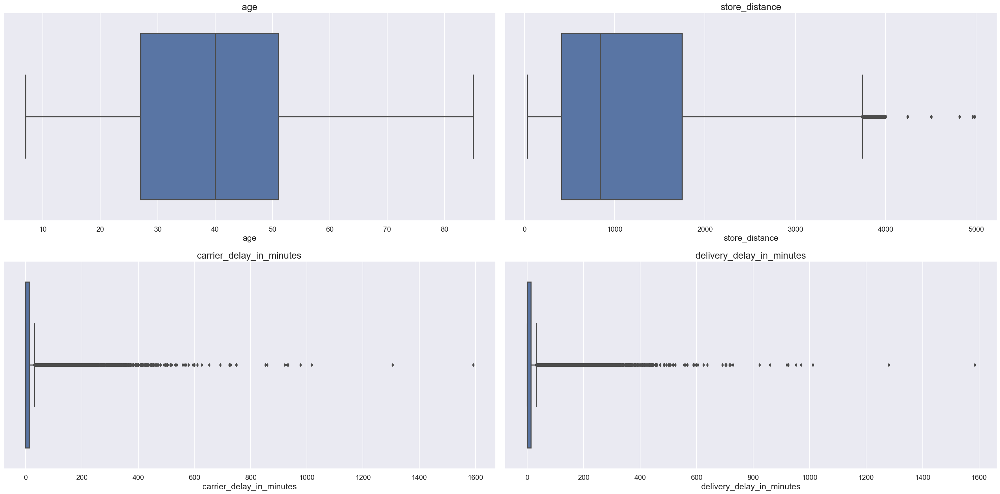

In [112]:
columns_to_plot = num_boxplot.columns

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(30, 15))
fig.subplots_adjust(hspace=0.5)

# Aumentando o tamanho da fonte nos eixos e títulos
sns.set_context("talk")

# Usando divmod para encontrar os eixos
for i, column in enumerate(columns_to_plot):
    row, col = divmod(i, 2)
    ax = axes[row, col]
    
    # Plotando os boxplots
    sns.boxplot(df1, x=column, ax=ax)
    ax.set_title(column, fontsize=20)  # Definindo o tamanho da fonte do título
    ax.tick_params(axis='both', which='major', labelsize=15)  # Definindo o tamanho da fonte nos eixos

plt.tight_layout()
plt.show()


### Summary

#### Age
It is possible to identify that 50% of the data is concentrated from approximately 27 to 50 but they varies from approximately 10 to 80 and all data recorded are within this range;

#### Store Distance
It is possible to identify that most of the records vary from 0 to approximately 2000, while some records are very high and are indicated as outliers. However, these characteristics are related to the distance from the store to the city center, and some of them may be located in other areas, distant from the center. I decided to keep these values because they may be outliers, but they do not seem to be errors and may be part of the group. In a real problem, these values can be checked through the store ID and location.

#### Carrier Delay in Minutes and Delivery Delay in Minutes
It is possible to identify that most of the records are close to 0 and vary very little. However, the delay is measured in minutes and they are almost insignificant. There are some extremely high values, which could be an error or they might be real. Comparing to our lives, we know that problems occur and some delays happen. I have decided to keep those records since they could be part of the process.

###### Categorical Attributes

Bar plot comparing the distribuition for all categorical variables in relation to the variable response

In [31]:
labels = cat_attributes.columns
label = 'satisfaction'

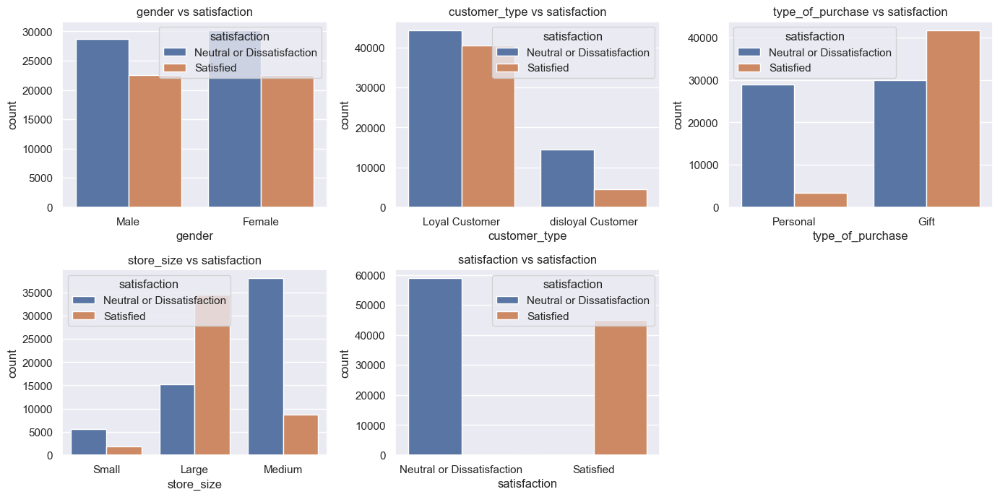

In [32]:
plt.figure(figsize=(14, len(labels) * 2))
for i, col in enumerate(labels):
    plt.subplot(len(labels) // 2 + 1, 3, i + 1)
    sns.countplot(x=col, hue=label, data=df1)
    plt.title(f"{col} vs {label}")
    plt.tight_layout()

#### Through the charts above it is possible to extract some insights:

- The behavior according the gender seems to be irrelevant, they seems to behave in a very similar way;

- There are a high volume of loyal customer and some actions could be taken considering these customers in order to revert the level of satisfaction;

- Customers buying stuffs for themselves seems to be neutral or dissatisfaction, this is a valuable information where the sales team can act immediately;

- Customers from medium stores seems to be neutral or dissatisfaction, this shows where maybe the company should start the action plan to revert the satisfaction level of their customers;

### 4.2 Bivariate Analysis

1. As the dressing room score increases, the volume of dissatisfied customers decreases.
<p>  
    
    **Hyphotesis is true.** This could be used to take immediate action, as per example, improving the quality of the dressing rooms for stores that have a low score on this characteristics.
</p>

In [33]:
aux = df4_eda[['id','dressing_room','satisfaction']].groupby(['dressing_room','satisfaction']).count().reset_index()
fig = px.bar(aux, x="dressing_room", y="id",
             color='satisfaction',
             barmode='group',
             text='id',
             color_discrete_sequence=['mediumturquoise', 'lightgreen'],
             height=600,
             width=1000)

fig.update_traces(texttemplate='%{text:.2s}', 
                  textposition='outside')

fig.update_layout(uniformtext_minsize=8, 
                  uniformtext_mode='hide',
                  title={ 'text':'Dressing Room Score vs Customer Satisfaction', 'x':0.45, 'y':0.95},
                  plot_bgcolor='white',
                  paper_bgcolor='white')

fig.show()

2. As the toilet cleaning score increases, the volume of dissatisfied customers decreases.
<p>
    
    **Hyphotesis is True.** This could be used to take immediate action. Even the hyphotesis is true, there are not a discrepancy between the satisfied and dissatisfaction customers. So this is definetly something to work on. Improving the frequency of the cleaning, audit the process of cleaning, etc. 
</p>

In [34]:
aux = df4_eda[['id','toilet_cleaning','satisfaction']].groupby(['toilet_cleaning','satisfaction']).count().reset_index()
fig = px.bar(aux, x="toilet_cleaning", y="id",
             color='satisfaction',
             barmode='group',
             text='id',
             color_discrete_sequence=['mediumturquoise', 'lightgreen'],
             height=600,
             width=1000)

fig.update_traces(texttemplate='%{text:.2s}', 
                  textposition='outside')

fig.update_layout(uniformtext_minsize=8, 
                  uniformtext_mode='hide',
                  title={ 'text':'Toilet Cleaning Score vs Customer Satisfaction', 'x':0.45, 'y':0.95},
                  plot_bgcolor='white',
                  paper_bgcolor='white')

fig.show()

3. Male customers are generally more satisfied than female customers.
<p>
    
    **Hyphotesis is False.**
</p>

In [35]:
aux2 = pd.crosstab(df4_eda['gender'], df4_eda['satisfaction'])
aux2['percentage'] = aux2['Neutral or Dissatisfaction']/(aux2['Neutral or Dissatisfaction']+aux2['Satisfied'])

colors = ['mediumturquoise', 'lightgreen']

fig = go.Figure(data=[go.Pie(labels= ['Female', 'Male'], values= [57, 56])])

fig.update_traces(hoverinfo='label+percent', textinfo='value', textfont_size=20,
                  marker=dict(colors=colors, line=dict(color='#000000', width=2)))


fig.update_layout(uniformtext_minsize=8, 
                  uniformtext_mode='hide',
                  title={ 'text':'Percent. of Gender vs Customer Satisfaction', 'x':0.50, 'y':0.95},
                  height=600,  # Adjust the height as needed
                  width=1000    # Adjust the width as needed
                  )
fig.show()

4. The larger the store, the more satisfied its customers tend to be.
<p>
    
    **Hyphotesis is True.** This also helps to set up an action plan, focusing first where the issue is more significant.
</p>

In [36]:
aux1 = df4_eda[['id','store_size','satisfaction']].groupby(['store_size','satisfaction']).count().reset_index()

fig = px.bar(aux1, x="store_size", y="id",
             color='satisfaction',
             barmode='group',
             text='id',
             color_discrete_sequence=['mediumturquoise', 'lightgreen'],
             height=600,
             width=1000)

fig.update_traces(texttemplate='%{text:.2s}', 
                  textposition='outside')

fig.update_layout(uniformtext_minsize=8, 
                  uniformtext_mode='hide',
                  title={ 'text':'Store Size vs Customer Satisfaction', 'x':0.35, 'y':0.95},
                  plot_bgcolor='white',
                  paper_bgcolor='white')

fig.show()

5. Even unsatisfied customers are happy with the store service.
<p>
    
    **Hyphotesis is True.** This helps to understand if the staff is providing good service, and may indicate that the direction of actions is more related to the stores' infrastructure.
</p>

In [37]:
aux =df4_eda[['id','store_service','satisfaction']].groupby(['store_service','satisfaction']).count().reset_index()

fig = px.bar(aux, x="store_service", y="id",
             color='satisfaction',
             barmode='group',
             text='id',
             color_discrete_sequence=['mediumturquoise', 'lightgreen'],
             height=600,
             width=1000)

fig.update_traces(texttemplate='%{text:.2s}', 
                  textposition='outside')

fig.update_layout(uniformtext_minsize=8, 
                  uniformtext_mode='hide',
                  title={ 'text':'Store Service Score vs Customer Satisfaction', 'x':0.50, 'y':0.95},
                  plot_bgcolor='white',
                  paper_bgcolor='white')

fig.show()


### 4.3 Multivariate Analysis

###### Numerical Variables

Correlation matrix between the numerical variables

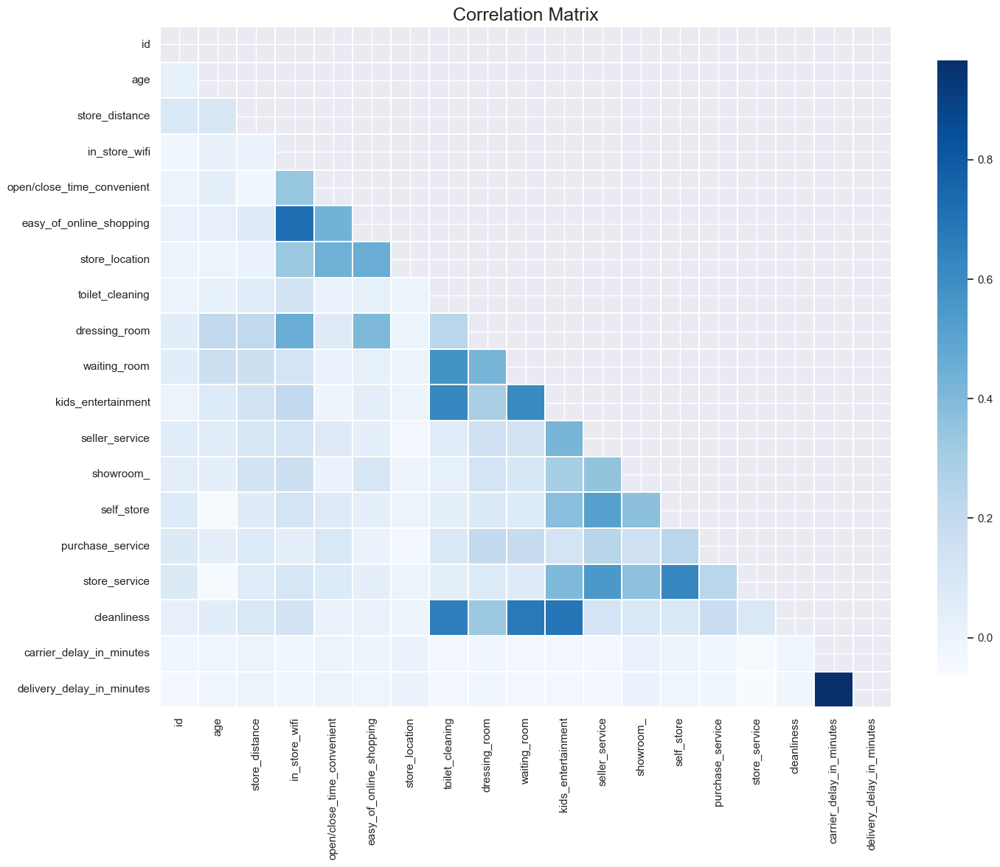

In [38]:
aux = num_attributes.copy()

mask = np.zeros_like(aux.corr(), dtype=bool) 
mask[np.triu_indices_from(mask)] = True 

f, ax = plt.subplots(figsize=(16, 12))

plt.title('Correlation Matrix',fontsize=18)
sns.heatmap(aux.corr(), linewidths=0.25, fmt=".2f", cmap="Blues", linecolor='w', annot=True, annot_kws={"size":9}, mask=mask, cbar_kws={"shrink": .9});

## 5. DATA PREPARATION

In [39]:
df5 = df4_eda.copy()

<p style="text-align: justify"> In this phase, I have worked on feature engineering, encoding, and rescaling techniques.

On feature engineering, I have created two new features:
* **distance:** Classify as 'close' those instances where the 'store_distance' value is lower than 2500, and as 'far' those instances where the 'store_distance' value is higher.
* **age group :** Assign the label "young" if the age is lower than 18, "adult" if it is higher than or equal to 18 and lower than 60, and "elderly" if the age is 60 or higher.

On encoding and rescaling, I have worked with:

* **Frequency Encoding:** Change categorical values to numerical values based on their frequency of occurrence.
* **Ordinal Encoding:** Change categorical values to numerical values, taking into consideration the importance of each value.
* **Min Max Scaler:** Rescaling the numerical features is applied to features that do not follow a normal distribution.
* **Robust Scaler:** Rescaling the numerical features is applied to features that follow a normal distribution and contain outliers.
</p>

In [40]:
# FREQUENCY ENCODER
# gender
fe_gender = df5.groupby('gender').size() / len(df5)
df5['gender'] = df5['gender'].map( fe_gender )
#joblib.dump(fe_gender, 'fe_gender.joblib')

# type_of_purchase
fe_tpurchase = df5.groupby( 'type_of_purchase' ).size() / len( df5 ) 
df5['type_of_purchase'] = df5['type_of_purchase'].map( fe_tpurchase )
#joblib.dump(fe_tpurchase, 'fe_tpurchase.joblib')

# ORDINAL ENCODER
oea = pp.OrdinalEncoder()
oeb = pp.OrdinalEncoder()
oec = pp.OrdinalEncoder()
oed = pp.OrdinalEncoder()

# distance
df5['distance'] = oea.fit_transform(df5[['distance']].values)
#joblib.dump(oea, 'oe_distance.joblib')

# age_group
df5['age_group'] = oeb.fit_transform(df5[['age_group']].values)
#joblib.dump(oeb, 'oe_ageg.joblib')

# customer_type
df5['customer_type'] = oec.fit_transform(df5[['customer_type']].values)
#joblib.dump(oec, 'oe_customer.joblib')

# Store Size
df5['store_size'] = oed.fit_transform( df5[['store_size']].values )
#joblib.dump(oed, 'oe_store_size.joblib')

# REESCALING
mms = pp.MinMaxScaler()

# age
df5['age'] = mms.fit_transform( df5[['age']].values )
#joblib.dump(mms, 'mms_age.joblib')

# ROBUST SCALER
rs = pp.RobustScaler()

# Store Distance
df5['store_distance'] = rs.fit_transform( df5[['store_distance']].values )
#joblib.dump(rs, 'rs_stored.joblib')

# TRANSFORMACAO LOGARITMICA 
# carrier_delay_in_minutes
df5['carrier_delay_in_minutes'] = df5['carrier_delay_in_minutes'].apply(lambda x: np.log(x) if x > 0 else x) 

# delivery_delay_in_minutes
df5['delivery_delay_in_minutes'] = df5['delivery_delay_in_minutes'].apply(lambda x: np.log(x) if x > 0 else x) 

# Response
# satisfaction
df5['satisfaction'] = df5['satisfaction'].apply(lambda x: 1 if x=='Satisfied' else 0)

### 5.1 - Train, test, validation split

Before to start with the algorithms, tree new datasets were created from the initial one:

* **train:** Containing aroun 70% of the total data and it will be used to train the algorithm.
* **validation:** Containing around 15% of the total data and it will be used to select the best parameters (fine tuning)
* **test:** Containing around 15% of the total data and it will be used to evaluate the selected model after tuning.

In [41]:
X = df5.drop( ['satisfaction'], axis=1 )
y = df5['satisfaction'].copy()

train_x, val_x, train_y, val_y   = ms.train_test_split( X, y, test_size=0.15, shuffle=True, random_state = 0 )
train_x, test_x, train_y, test_y   = ms.train_test_split( train_x, train_y, test_size=0.15, shuffle=True, random_state = 0 )
print(f" train_x: {train_x.shape}\n train_y: {train_y.shape}\n val_x: {val_x.shape}\n val_y: {val_y.shape}\n test_x: {test_x.shape}\n test_y: {test_y.shape}\n")

 train_x: (75070, 25)
 train_y: (75070,)
 val_x: (15586, 25)
 val_y: (15586,)
 test_x: (13248, 25)
 test_y: (13248,)



## 6. FEATURE SELECTION

I am preparing to execute a machine learning algorithm aimed at identifying the most important features for optimal learning. In this process, I plan to leverage multiple tools, including the analysis of a feature importance chart, examination of the correlation matrix, and validation of hypotheses, to strategically determine which features to incorporate into the machine learning models.

The correlation matrix will guide me in identifying and potentially removing features that exhibit high correlation, ensuring that the chosen variables contribute unique information to the model. Simultaneously, the feature importance chart will assist in the selection of features that hold greater significance for the machine learning model, thereby enhancing its predictive capabilities.

In this initial cycle, I intend to include all available features. However, in subsequent cycles, I will critically evaluate the necessity of retaining each feature. This evaluation will focus on potential benefits such as reducing model complexity and size. By iteratively refining the feature set, I aim to enhance the efficiency and effectiveness of the machine learning model over time.

I am going to use the datasets below for feature selection:
- X: contains all features
- y: contains the variable response

In [42]:
df6_x = X.copy()
df6_y = y.copy()

In [43]:
# model definition
xgboost = XGBClassifier()

# model training
xgboost.fit(df6_x, df6_y)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

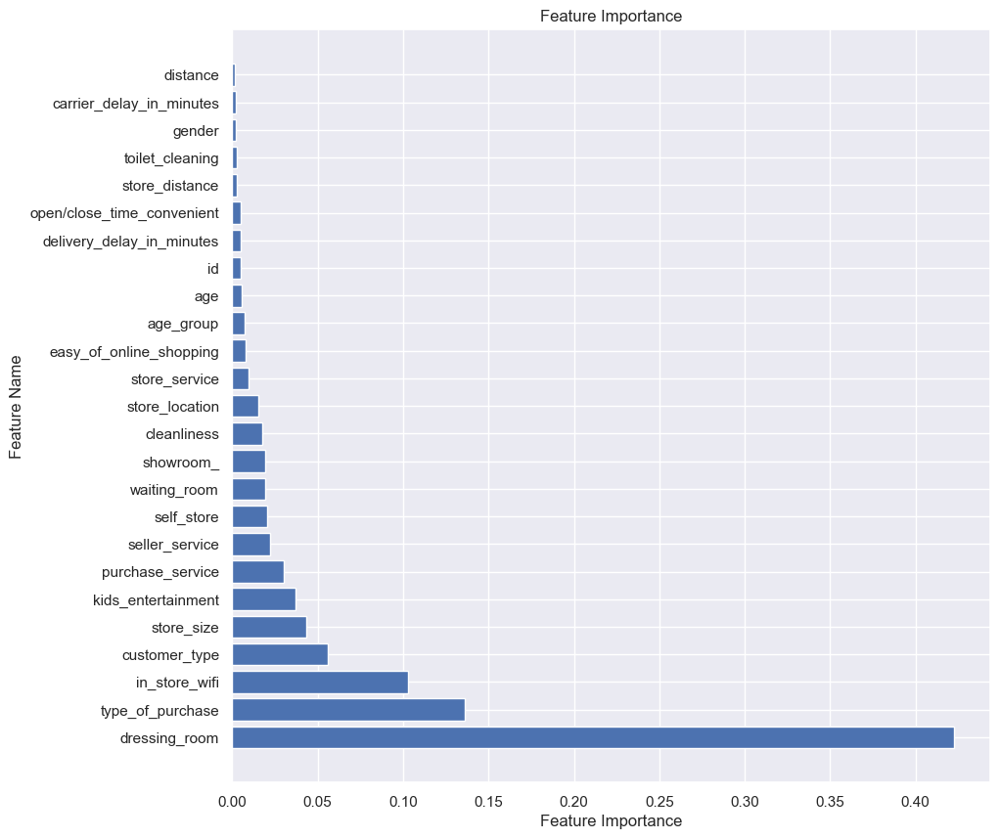

In [44]:
feature_importances = xgboost.feature_importances_
feature_names = df6_x.columns 
feature_importance_dict = dict(zip(feature_names, feature_importances))
sorted_feature_importance = sorted(feature_importance_dict.items(), key=lambda x: x[1], reverse=True)
sorted_feature_names, sorted_importance_scores = zip(*sorted_feature_importance)
plt.figure(figsize=(10, 10))

plt.barh(sorted_feature_names, sorted_importance_scores)
plt.xlabel("Feature Importance")
plt.ylabel("Feature Name")
plt.title("Feature Importance")
plt.show()

## 7. MACHINE LEARNING

**The aim of the project is to identify Neutral or Dissatisfied Customers**

On this step, I will use the datasets as per below:
- X, y: to train and evaluate the machine learning models using cross validation technique;
- train_x, train_y: to train the machine learning models;
- val_x, val_y: to evaluate the trained machine learning models;
- test_x, test_y: to evaluate the machine learning model, after hyperparameteres fine tuning;


The algorithms will be evaluated calculating the micro-precision metric;
- Precision micro: represents the ratio of correct classifications for a positive class in relation to the total positive instances that the algorithm predicted.

### 7.2 Machine Learning Models

On this step, I am just runing the machine learning algorithm without any parameter tuning, just using the standard model to evaluate them and decide if they can be used on this project.

There are two informations to be considered on this phase:

* The metric itself
* The confusion matrix

The performance for the machine learning are as per below:

| ML Model                | Precision_micro cross_validation|Precision_micro Train, Val, Test Split |
|:------------------------|:--------------------------------|---------------------------------------|
| XGB                     | 0.9643                          |0.9627                                 |
| LGBM                    | 0.9651                          |0.9634                                 |
| Logistic Regression     | 0.5666                          |0.5696                                 |
| Randon Forest           | 0.9643                          |0.9630                                 |


#### 7.2.1 XGB

7.2.1.1 Performance using cross_validation technique

In [45]:
clf_xgb = XGBClassifier()

evalxgb = cross_validation(5, 'XGB', clf_xgb, X, y)
evalxgb

0.9643709380639816

7.2.1.2 Performance using train_test_val split technique

In [46]:
# model training
clf_xgb.fit(train_x, train_y )

# model prediction - Check if the model perform well
yhat_xgb = clf_xgb.predict( val_x )

# performance
precision_score(val_y, yhat_xgb, average='micro')

0.9627871166431413

In [47]:
val_y.value_counts()

satisfaction
0    8878
1    6708
Name: count, dtype: int64

**Confusion Matrix for XGBoost Classifier:**

Analyzing the chart, the XGBoost Classifier was able to find 8673 dissatisfied customers in a universe of 8878 customers dissatisfied. Making 207 wrong predictions when analyzing the interested class Neutral / Dissatisfied Customers.

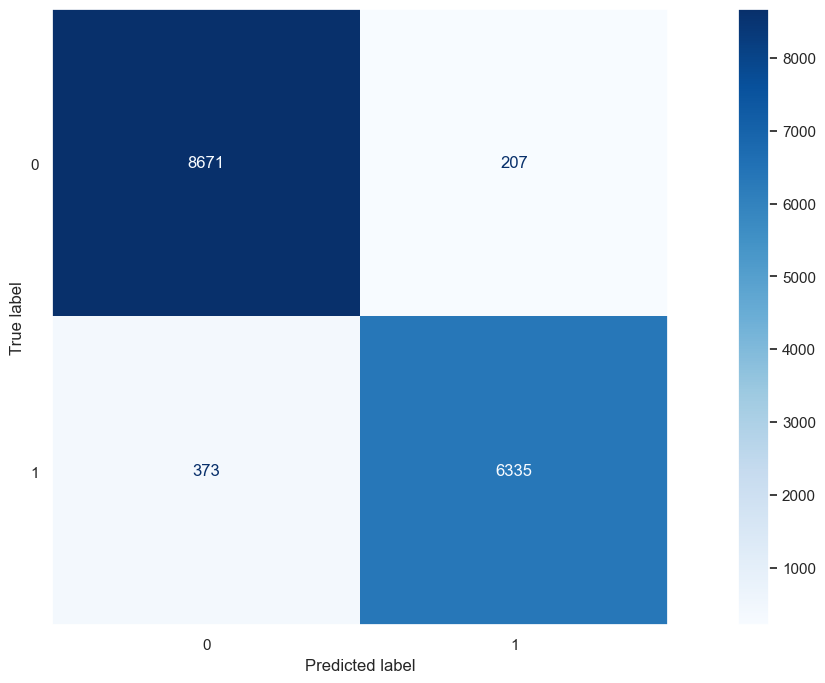

In [48]:
#| label: fig_nine
#| fig-cap: "Figure 9: XGB Confusion Matrix"

cm_xgb = confusion_matrix(val_y, yhat_xgb,  labels = clf_xgb.classes_)
cm_xgb_disp = ConfusionMatrixDisplay(confusion_matrix = cm_xgb,
                                      display_labels = clf_xgb.classes_,
                                     )

cm_xgb_disp.plot(cmap=plt.cm.Blues)
plt.grid(False) # removing grid
plt.gca().set_facecolor('white') # changing background color to white

plt.show()

To analyze the chart above, consider:
- 0: Neutral or Dissatisfaction
- 1: Satisfied

#### 7.2.2 LGBM

7.2.2.1 Performance using cross_validation technique

In [49]:
clf_lgbm = lgbm.LGBMClassifier(verbose=-1)

evallgbm = cross_validation(5, 'LGBM', clf_lgbm, X, y)
evallgbm

0.9651793818101873

7.2.2.2 Performance using train_test_split technique

In [50]:
# model training
clf_lgbm.fit( train_x, train_y )

# model prediction - Check if the model perform well
yhat_lgbm = clf_lgbm.predict( val_x )

# performance
precision_score(val_y, yhat_lgbm, average='micro')

0.9634928782240472

**Confusion Matrix for LGBM Classifier:**

Analyzing the chart, the LGBM Classifier was able to find 8688 dissatisfied customers in a universe of 8878, making 190 wrong predictions when analyzing the interested class Neutral / Dissatisfied Customers.

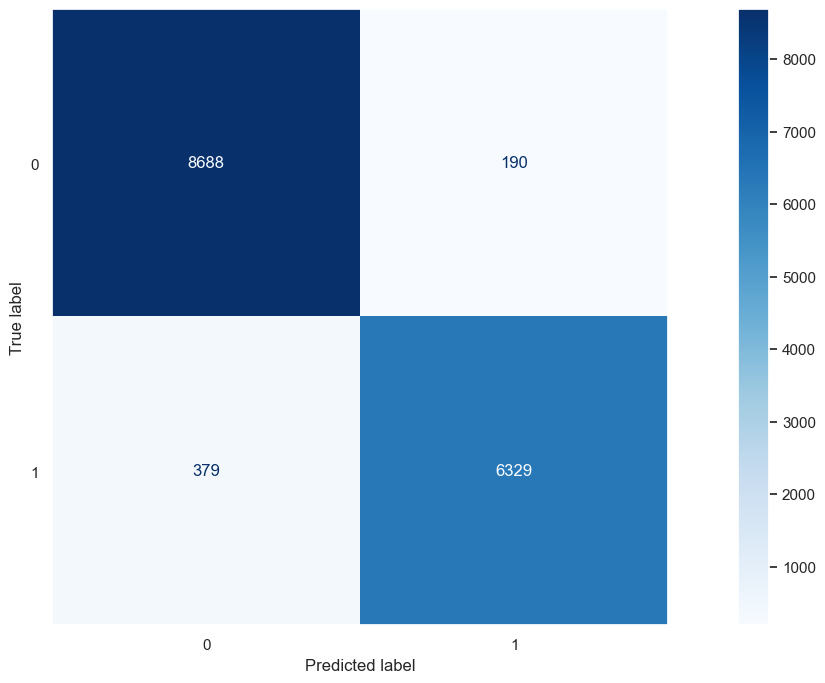

In [51]:
#| label: fig_ten
#| fig-cap: "Figure 10: LGBM Confusion Matrix"

cm_lgbm = confusion_matrix(val_y, yhat_lgbm,  labels = clf_lgbm.classes_)
cm_lgbm_disp = ConfusionMatrixDisplay(confusion_matrix = cm_lgbm,
                                      display_labels = clf_lgbm.classes_,
                                     )

cm_lgbm_disp.plot(cmap=plt.cm.Blues)
plt.grid(False) # removing grid
plt.gca().set_facecolor('white') # changing background color to white

plt.show()

To analyze the chart above, consider:
- 0: Neutral or Dissatisfaction
- 1: Satisfied

#### 7.2.3 Logistic Regression

7.2.3.1 Performance using cross_validation technique

In [52]:
clf_lr = LogisticRegression()

evallr = cross_validation(5, 'Logistic Regression', clf_lr, X, y)
evallr

0.5666673081240133

7.2.3.2 Performance using train_test_split technique

In [62]:
# Model Training
clf_lr.fit( train_x, train_y )

# Prediction
yhat_lr = clf_lr.predict(val_x)

# performance
precision_score(val_y, yhat_lr, average='micro')

0.5696137559348133

**Confusion Matrix for Logistic Regression Classifier:**

Analyzing the chart, it is possible to identify that the Logistic Regression was not able to identify any satisfied customer. This algorithm has classified every customer as dissatisfied.

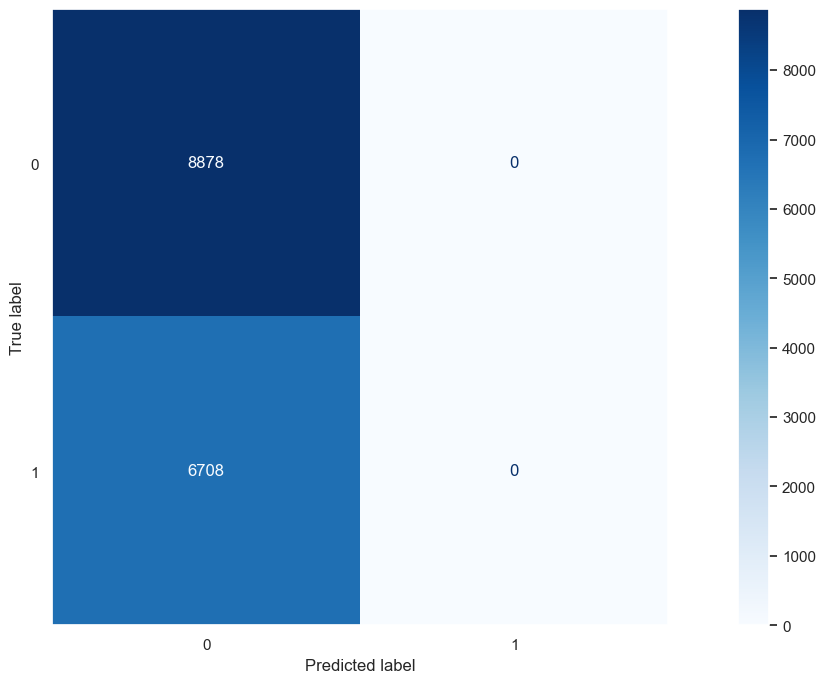

In [59]:
#| fig-cap: "Figure 11: Logistic Regression Classifier Confusion Matrix"

cm_lr      = confusion_matrix(val_y, yhat_lr,  labels = clf_lr.classes_)
cm_lr_disp = ConfusionMatrixDisplay(confusion_matrix = cm_lr,
                                    display_labels = clf_lr.classes_,
                                     )

cm_lr_disp.plot(cmap=plt.cm.Blues)
plt.grid(False) # removing grid
plt.gca().set_facecolor('white') # changing background color to white

plt.show()

To analyze the chart above, consider:
- 0: Neutral or Dissatisfaction
- 1: Satisfied

### 7.2.4 Randon Forest Classifier

7.2.4.1 Performance using cross_validation technique

In [55]:
clf_rf = en.RandomForestClassifier()

evalrf = cross_validation(5, 'Randon Forest', clf_rf, X, y)
evalrf

0.964303577169102

7.2.4.2 Performance using train_test_split technique

In [56]:
# Model Training
clf_rf.fit( train_x, train_y )

# Prediction
yhat_rf = clf_rf.predict(val_x)

# performance
precision_score(val_y, yhat_rf, average='micro')

0.9630437572180162

**Confusion Matrix for Randon Forest Classifier:**

Analyzing the chart, the Randon Forest Classifier was able to find 8685 dissatisfied customers in a universe of 8878, where only 193 dissatisfied customers were classified incorreclty.

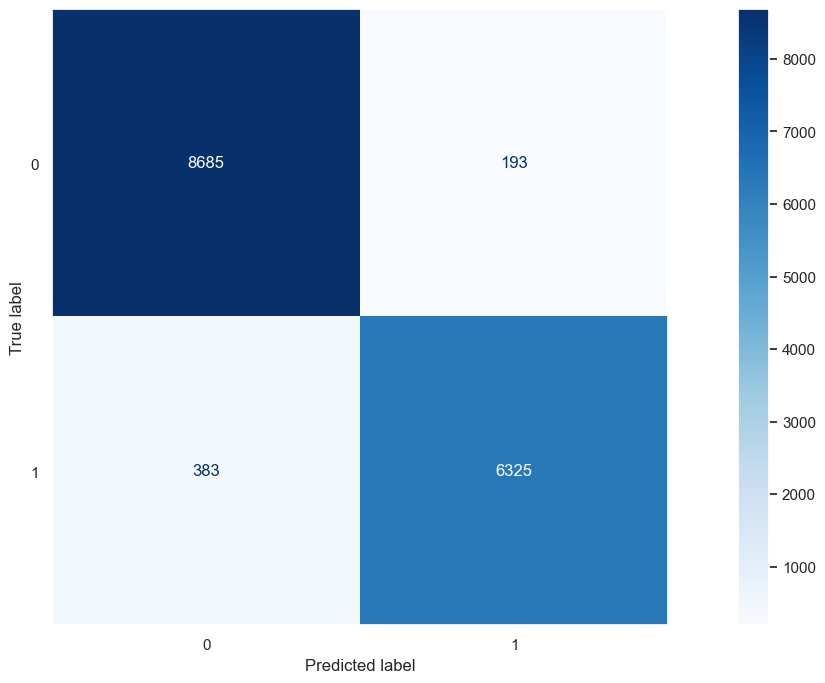

In [57]:
#| fig-cap: "Figure 12: Randon Forest Confusion Matrix"

cm_rf      = confusion_matrix(val_y, yhat_rf,  labels = clf_rf.classes_)
cm_rf_disp = ConfusionMatrixDisplay(confusion_matrix = cm_rf,
                                    display_labels = clf_rf.classes_,
                                     )

cm_rf_disp.plot(cmap=plt.cm.Blues)
plt.grid(False) # removing grid
plt.gca().set_facecolor('white') # changing background color to white

plt.show()

## 8. FINE TUNING

To perform a fine tuning on this project, I have used a bysean search algorithm called Optuna and I have used it do set up some parameters, and also, I have tunned some parameters separatelly.

### 8.1 XGB

In [ ]:
# def objective_xgb(trial):
#     """Define the objective function"""

#     params = {
#         'max_depth': trial.suggest_int('max_depth', 5, 20),
#         'eta': trial.suggest_float('eta', 0.01, 0.05),
#         'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 1.0),
#         'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
#         'min_child_weight': trial.suggest_int('min_child_weight', 1, 15),
#         'gamma': trial.suggest_loguniform('gamma', 1e-8, 1.0),
#         'subsample': trial.suggest_loguniform('subsample', 0.01, 1.0),
#         'colsample_bytree': trial.suggest_loguniform('colsample_bytree', 0.1, 1.0),
#         'reg_alpha': trial.suggest_loguniform('reg_alpha', 1e-8, 1.0),
#         'reg_lambda': trial.suggest_loguniform('reg_lambda', 1e-8, 1.0),
#         'eval_metric': 'mlogloss',
#         'use_label_encoder': False
#     }

#     # Fit the model
#     optuna_xgb = XGBClassifier(**params)
#     optuna_xgb.fit(x_train, y_train)

#     # Make predictions
#     optuna_xgb_pred = optuna_xgb.predict(test_x)

#     # Evaluate predictions
#     precision = precision_score(test_y, optuna_xgb_pred, average='micro')
#     return precision

In [ ]:
# %%time
# study_xgb = optuna.create_study(direction='maximize')
# study_xgb.optimize(objective_xgb, n_trials=150)

In [ ]:
# print('Number of finished trials: {}'.format(len(study_xgb.trials)))
# print('Best trial:')
# trial = study_xgb.best_trial

# print('  Value: {}'.format(trial.value))
# print('  Params: ')

# for key, value in trial.params.items():
#     print('    {}: {}'.format(key, value))

**These are the hyperparameteres values found through optuna:**
<p>

* max_depth: 12,
* eta: 0.019834339603301256,
* learning_rate: 0.011,
* n_estimators: 450,
* min_child_weight: 2,
* gamma: 0.3113641371820694,
* subsample: 0.7039764982894372,
* colsample_bytree: 0.6313892474468165,
* reg_alpha: 4.239283976142879e-06,
* reg_lambda: 7.270434099537632e-05
</p>

In [79]:
params_xgb = {
    'max_depth': 12,
    'eta': 0.019834339603301256,
    'learning_rate': 0.011,
    'n_estimators': 450,
    'min_child_weight': 2,
    'gamma': 0.3113641371820694,
    'subsample': 0.7039764982894372,
    'colsample_bytree': 0.6313892474468165,
    'reg_alpha': 4.239283976142879e-06,
    'reg_lambda': 7.270434099537632e-05
}

**I am running a fine tuning for the parameter learning rate**
Analysing the chart below, I have selected the value of 0,0130 for the paramater.

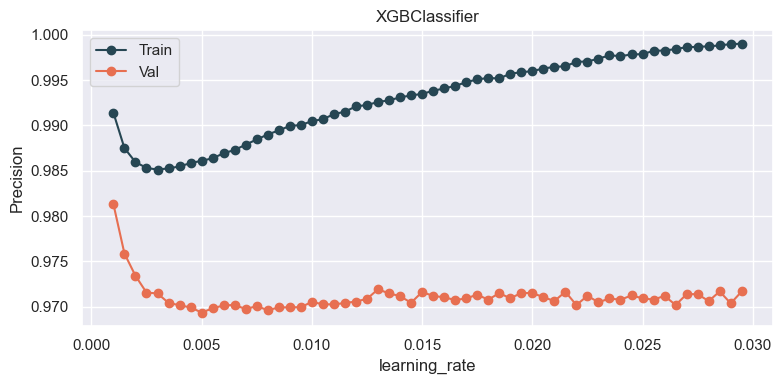

In [80]:
param_name = "learning_rate"
param_range = np.arange(0.001, 0.03, 0.0005)
fixed_params = params_xgb.copy()

plot_scores(param_name, param_range, fixed_params, XGBClassifier,'XGBClassifier', train_x, train_y, val_x, val_y)

In [81]:
params_xgb = {
    'max_depth': 12,
    'eta': 0.019834339603301256,
    'learning_rate': 0.0130,
    'n_estimators': 450,
    'min_child_weight': 2,
    'gamma': 0.3113641371820694,
    'subsample': 0.7039764982894372,
    'colsample_bytree': 0.6313892474468165,
    'reg_alpha': 4.239283976142879e-06,
    'reg_lambda': 7.270434099537632e-05
}

**I am running a fine tuning for the parameter Number of Estimators**
Analysing the chart below, I have selected the value of 400 for the paramater.

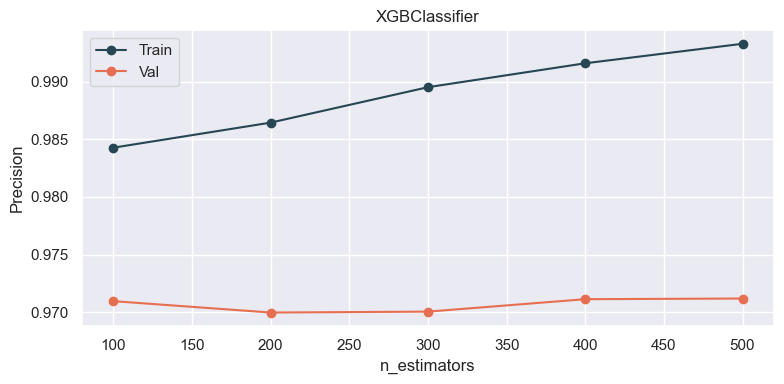

In [82]:
#| label: fig_twelve
#| fig-cap: "Figure 12: N. Estimators vs Precision"

param_name = "n_estimators"
param_range = np.arange(100, 600, 100)
fixed_params = params_xgb.copy()

plot_scores(param_name, param_range, fixed_params, XGBClassifier,'XGBClassifier', train_x, train_y, val_x, val_y)

In [83]:
params_xgb = {
    'max_depth': 12,
    'eta': 0.019834339603301256,
    'learning_rate': 0.0130,
    'n_estimators': 400,
    'min_child_weight': 2,
    'gamma': 0.3113641371820694,
    'subsample': 0.7039764982894372,
    'colsample_bytree': 0.6313892474468165,
    'reg_alpha': 4.239283976142879e-06,
    'reg_lambda': 7.270434099537632e-05
}

**I am running a fine tuning for the parameter Max Dpeth**
Analysing the chart below, I have selected the value of 10 for the paramater.

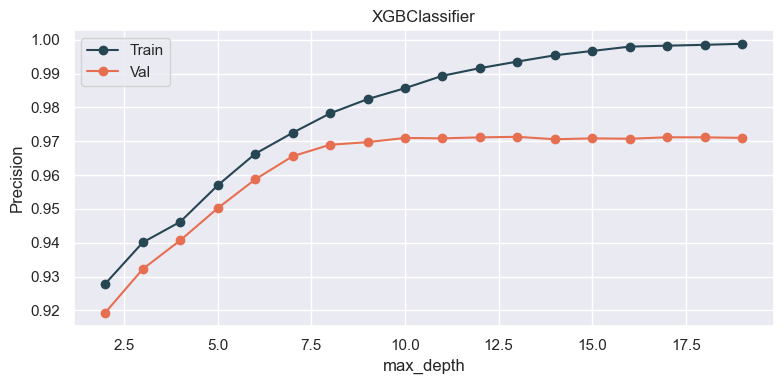

In [84]:
#| label: fig_thirtheen
#| fig-cap: "Figure 13: N. Max Depth vs Precision "

param_name = "max_depth"
param_range = np.arange(2, 20, 1)
fixed_params = params_xgb.copy()

plot_scores(param_name, param_range, fixed_params, XGBClassifier,'XGBClassifier', train_x, train_y, val_x, val_y)

**The final parameters fox XGB are:**
<p>

* max_depth': 10,
* eta': 0.019834339603301256,
* learning_rate': 0.0130,
* n_estimators': 400,
* min_child_weight': 2,
* gamma': 0.3113641371820694,
* subsample': 0.7039764982894372,
* colsample_bytree': 0.6313892474468165,
* reg_alpha': 4.239283976142879e-06,
* reg_lambda': 7.270434099537632e-05
</p>

In [85]:
# Final parameters to train XGB Classifier
params_xgb = {
    'max_depth': 12,
    'eta': 0.019834339603301256,
    'learning_rate': 0.0130,
    'n_estimators': 400,
    'min_child_weight': 2,
    'gamma': 0.3113641371820694,
    'subsample': 0.7039764982894372,
    'colsample_bytree': 0.6313892474468165,
    'reg_alpha': 4.239283976142879e-06,
    'reg_lambda': 7.270434099537632e-05
}

### 8.2 LGBM

In [86]:
# def objective_lgbm(trial):
#     """Objective function"""
#     param = {
#         "n_estimators":trial.suggest_int('n_estimators', 100, 1000),
#         'boosting_type': trial.suggest_categorical('boosting_type', ['gbdt','dart']),
#         'reg_alpha': trial.suggest_float('reg_alpha', 1e-3, 1e-1, log=True),
#         'reg_lambda': trial.suggest_float('reg_lambda', 1e-6, 1e-4, log=True),
#         "learning_rate":trial.suggest_float('learning_rate', 0.01, 0.1),
#         "max_depth":trial.suggest_int('max_depth', 5, 20),
#         "objective": "binary",
#         "metric": "binary_logloss",
#         "num_leaves": trial.suggest_int("num_leaves", 2, 256),
#         "bagging_fraction": trial.suggest_float("bagging_fraction", 0.4, 1.0),
#     }
    
#     # Definicao do Modelo
#     lgbm_model = lgbm.LGBMClassifier(**param)
    
#     # Treinamento do Modelo
#     lgbm_model.fit(train_x, train_y)
    
#     # Predicoes do Modelo
#     preds = lgbm_model.predict(test_x)
    
#     # Metrica
#     precision = precision_score(test_y, preds, average='micro')
#     return precision

In [87]:
# %%time
# study_lgbm = optuna.create_study(direction='maximize')
# study_lgbm.optimize(objective_lgbm, n_trials=150)

In [88]:
# print('Number of finished trials: {}'.format(len(study_lgbm.trials)))
# print('Best trial:')
# trial = study_lgbm.best_trial

# print('  Value: {}'.format(trial.value))
# print('  Params: ')

# for key, value in trial.params.items():
#     print('    {}: {}'.format(key, value))

In [89]:
# fig = optuna.visualization.plot_slice(study_lgbm, params=["learning_rate", "max_depth", "n_estimators", "reg_alpha", "reg_lambda"])
# fig.show()

**These are the hyperparameteres values found through optuna for the LGBM Algorithm:**
<p>
    
* verbose:-1,
* n_estimators: 600,
* boosting_type: 'dart',
* reg_alpha: 0.001060107983785464,
* reg_lambda: 4.014338101780075e-06,
* learning_rate: 0.06,
* max_depth: 11,
* num_leaves: 74,
* bagging_fraction: 0.6210384794469442
</p>

**I am tuning the Learning Rate Parameter**: The value selected is 0.065 because it performed better, according the chart below.

In [90]:
params_lgbm = {
    'verbose':-1,
    'n_estimators': 600,
    'boosting_type': 'dart',
    'reg_alpha': 0.001060107983785464,
    'reg_lambda': 4.014338101780075e-06,
    'learning_rate': 0.06,
    'max_depth': 11,
    'num_leaves': 74,
    'bagging_fraction': 0.6210384794469442
}

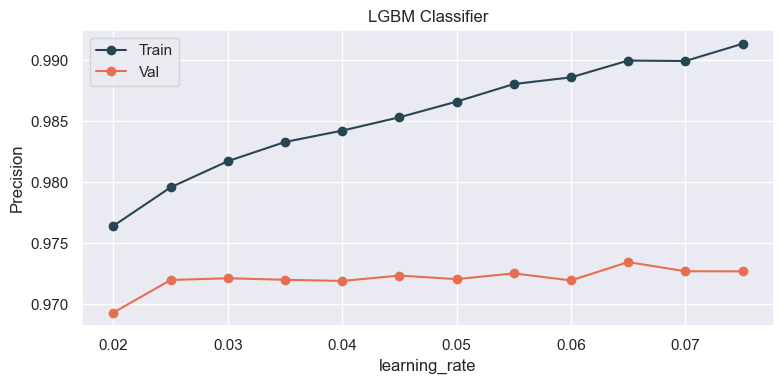

In [91]:
#| label: fig_fourteen
#| fig-cap: "Figure 14: Learning rate vs Precision "

param_name = "learning_rate"
param_range = np.arange(0.02, 0.08, 0.005)
fixed_params = params_lgbm.copy()

plot_scores(param_name, param_range, fixed_params, lgbm.LGBMClassifier,'LGBM Classifier', train_x, train_y, val_x, val_y)

In [92]:
params_lgbm = {
    'verbose':-1,
    'n_estimators': 600,
    'boosting_type': 'dart',
    'reg_alpha': 0.001060107983785464,
    'reg_lambda': 4.014338101780075e-06,
    'learning_rate': 0.065,
    'max_depth': 11,
    'num_leaves': 74,
    'bagging_fraction': 0.6210384794469442
}

**I am tuning the Number of Estimators**: The value selected is 600 because it performed better, according the chart below.

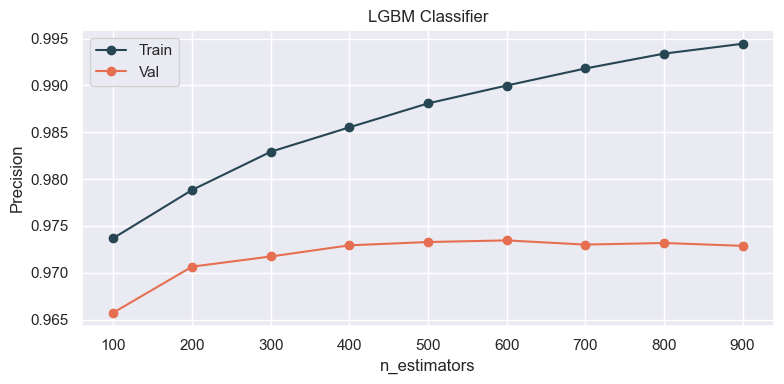

In [93]:
#| label: fig_fifteen
#| fig-cap: "Figure 15: N. Estimators vs Precision "

param_name = "n_estimators"
param_range = np.arange(100, 1000, 100)
fixed_params = params_lgbm.copy()

plot_scores(param_name, param_range, fixed_params, lgbm.LGBMClassifier,'LGBM Classifier', train_x, train_y, val_x, val_y)

In [94]:
params_lgbm = {
    'verbose':-1,
    'n_estimators': 600,
    'boosting_type': 'dart',
    'reg_alpha': 0.001060107983785464,
    'reg_lambda': 4.014338101780075e-06,
    'learning_rate': 0.065,
    'max_depth': 11,
    'num_leaves': 74,
    'bagging_fraction': 0.6210384794469442
}

**I am tuning the Max Depth parameter**: The value selected is 6 because it performed well and it runs faster when compared with model that have high values for max_depth

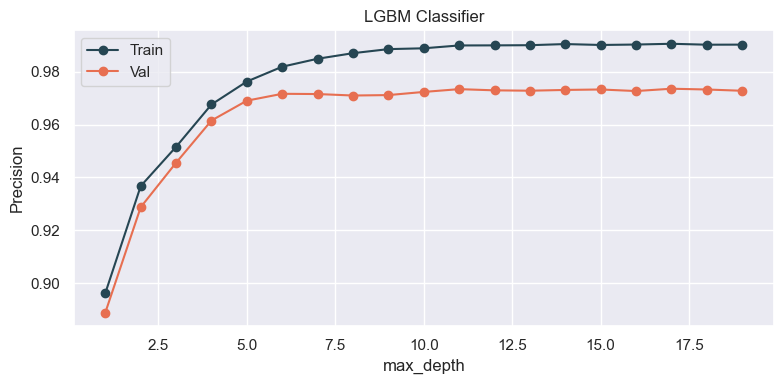

In [95]:
#| label: fig_sixteen
#| fig-cap: "Figure 16: Max Depth vs Precision "

param_name = "max_depth"
param_range = np.arange(1, 20, 1)
fixed_params = params_lgbm.copy()

plot_scores(param_name, param_range, fixed_params, lgbm.LGBMClassifier,'LGBM Classifier', train_x, train_y, val_x, val_y)

**The parameters to be used to train the LGBM model are as per below:**
<p>

* verbose:-1,
* n_estimators: 600,
* boosting_type: 'dart',
* reg_alpha: 0.001060107983785464,
* reg_lambda: 4.014338101780075e-06,
* learning_rate: 0.065,
* max_depth: 6,
* num_leaves: 74,
* bagging_fraction: 0.6210384794469442
</p>

In [96]:
# Final hyper parameters to be used to train LGBM
params_lgbm = {
    'verbose':-1,
    'n_estimators': 600,
    'boosting_type': 'dart',
    'reg_alpha': 0.001060107983785464,
    'reg_lambda': 4.014338101780075e-06,
    'learning_rate': 0.065,
    'max_depth': 6,
    'num_leaves': 74,
    'bagging_fraction': 0.6210384794469442
}

## 9 MACHINE LEARNING MODELS AFTER TUNING

### 9.1 XGB

In [97]:
xgb_tuned = XGBClassifier(**params_xgb)

eval_xgb = cross_validation(5, 'XGB', xgb_tuned, X, y)
eval_xgb

0.9649965294147098

In [98]:
# model training
xgb_tuned.fit(train_x, train_y )

# model prediction - Check if the model perform well
yhat_xgb_ft = clf_xgb.predict( test_x )

# performance
precision_score(test_y, yhat_xgb_ft, average='micro')

0.9634661835748792

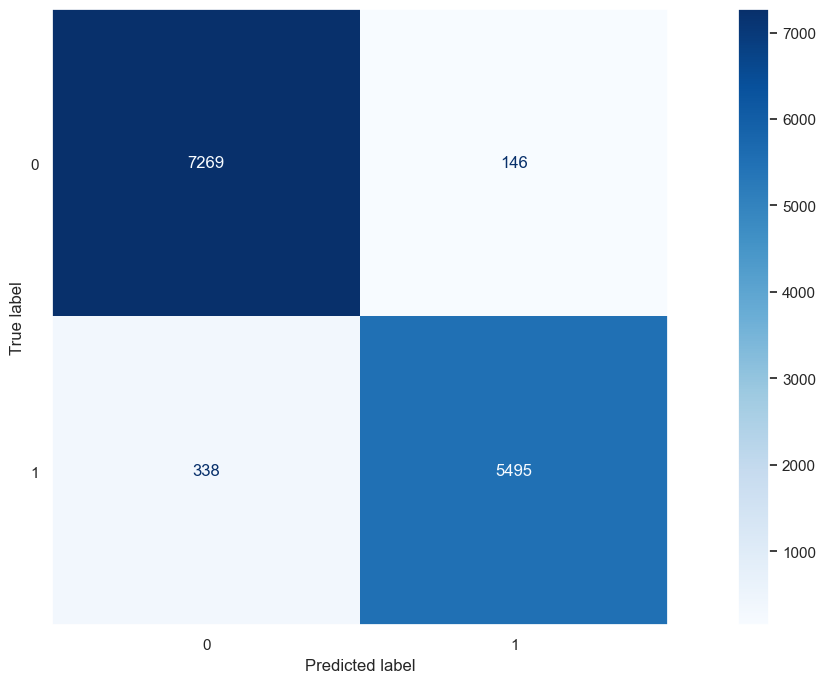

In [99]:
#| label: fig_seventenn
#| fig-cap: "Figure 17: XGB Tuned Confusion Matrix "

cm_xgb = confusion_matrix(test_y, yhat_xgb_ft,  labels = xgb_tuned.classes_)
cm_xgb_disp = ConfusionMatrixDisplay(confusion_matrix = cm_xgb,
                                      display_labels = xgb_tuned.classes_,
                                     )

cm_xgb_disp.plot(cmap=plt.cm.Blues)
plt.grid(False) # removing grid
plt.gca().set_facecolor('white') # changing background color to white

plt.show()

To analyze the chart above, consider:

0: Neutral or Dissatisfaction
1: Satisfied

### 9.2 LGBM

In [100]:
lgbm_tuned = lgbm.LGBMClassifier(**params_lgbm)

eval_lgbm = cross_validation(5, 'LGBM', lgbm_tuned, X, y)
eval_lgbm

0.9651120121155314

In [101]:
# model training
lgbm_tuned.fit( train_x, train_y )

# model prediction - Check if the model perform well
yhat_lgbm_ft = clf_lgbm.predict( test_x )

# performance
precision_score(test_y, yhat_lgbm_ft, average='micro')

0.9645229468599034

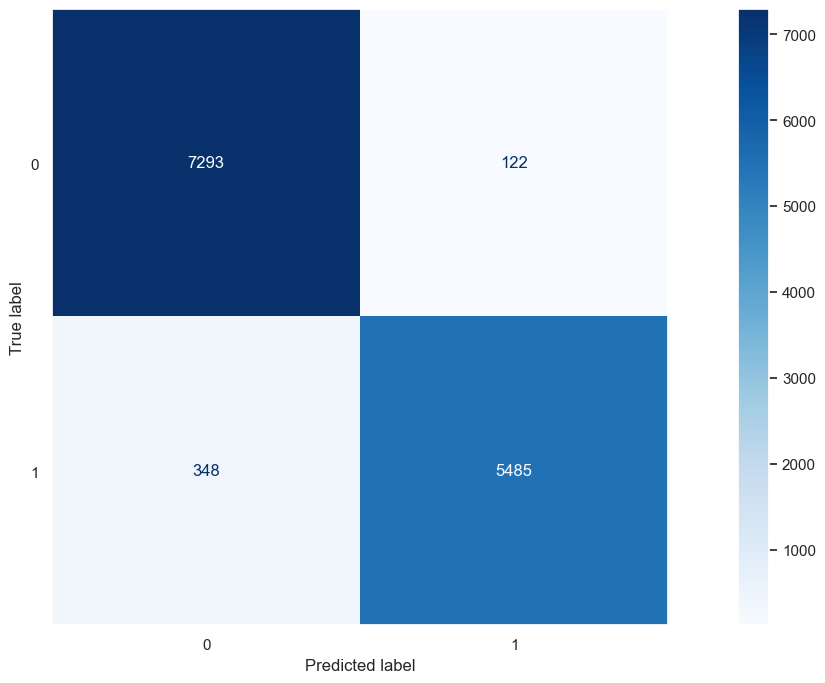

In [102]:
#| label: fig_eighteen
#| fig-cap: "Figure 18: Max Depth vs Precision "

cm_lgbm = confusion_matrix(test_y, yhat_lgbm_ft,  labels = lgbm_tuned.classes_)
cm_lgbm_disp = ConfusionMatrixDisplay(confusion_matrix = cm_lgbm,
                                      display_labels = lgbm_tuned.classes_,
                                     )

cm_lgbm_disp.plot(cmap=plt.cm.Blues)
plt.grid(False) # removing grid
plt.gca().set_facecolor('white') # changing background color to white

plt.show()

To analyze the chart above, consider:

* 0: Neutral or Dissatisfaction
* 1: Satisfied

## 10. TO PRODUCTION

### 10.1 Last Train to save Model for Deploy

On this phase I am running a last training within the selected algorithm using all datas available and saving the model locally, to deploy it into production.

In [107]:
lgbm_final = lgbm.LGBMClassifier(**params_lgbm)
lgbm_final.fit(X,y)

LGBMClassifier(bagging_fraction=0.6210384794469442, boosting_type='dart',
               learning_rate=0.065, max_depth=6, n_estimators=600,
               num_leaves=74, reg_alpha=0.001060107983785464,
               reg_lambda=4.014338101780075e-06, verbose=-1)

In [108]:
# Saving trained model to production
joblib.dump(lgbm_final, 'lgbm.joblib')

['lgbm.joblib']

## Summary

After the fine tuning, the results are as per below:

The performance for the machine learning are as per below:

| ML Model                | Precision_micro cross_validation|Precision_micro Train, Val, Test Split |
|:------------------------|:--------------------------------|---------------------------------------|
| XGB                     | 0.9649                          |0.9634                                 |
| LGBM                    | 0.9651                          |0.9645                                 |

The difference when comparing the chosen metric isn't significant. However, when comparing the predictions using the confusion matrix, there is a slightly noticeable difference. As the LGBM has shown better performance, I have decided to continue the project with this algorithm.

Just for better understanding, the dataset used to evaluate the models contains 13,248 records, with 7,415 dissatisfied customers and 5,833 satisfied customers. The LGBM was able to identify 7,293 dissatisfied customers, making 122 incorrect predictions, while XGB was able to identify 7,269, making 146 incorrect predictions.

I consider this a great result for the project, and it will certainly help to improve the satisfaction level of In Style customers.

For the next cyclecould be considered to:

- work on feature engineering
- work on values that are out of range (outliers)
- work on feature selection
- consider others machine learning algorithms